In [1]:
from typing import List, Optional
from tqdm import tqdm

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns
import scipy.stats as st
from scipy.stats import probplot, ks_2samp

from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestRegressor,LG
from sklearn.model_selection import KFold, cross_val_score
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_is_fitted
import missingno as msno
import xgboost as xgb
%matplotlib inline

In [353]:
class PSI(BaseEstimator, TransformerMixin):
    """
    Вычисление PSI и отбор признаков на их основе.

    Parameters
    ----------
    threshold: float
        Порог для отбора переменных по PSI.
        Если PSI для переменной выше порога - переменная макрируется
        0 (не использовать для дальнейшего анализа), если ниже
        порога - маркируется 1 (использовать для дальнейшего анализа).

    categorical_features: List[str], optional, default = None
        Список категориальных признаков для анализа.
        Опциональный параметр, по умолчанию, не используется, т.е.
        категориальные признаки отсутствуют.

    n_bins: int, optional, default = 20
        Количество бинов, на которые разбивается выборка.

    min_value: float, optional, default = 0.005
        Значение которое используется, если рассчитанный psi = 0.

    bin_type: string, optional, default = "quanitles"
        Способ разбиения на бины: "quantiles" or "bins".
        При выборе "quantiles" - выборка будет разбита на n_bins
        квантилей, при выборке "bins" - выборка будет разбита на
        n_bins бакетов с равным шагом между бакетами.
        Иные значения приводят к возникновению ValueError.

    Attributes
    ----------
    scores_: Dict[str, float]
        Словарь со значениями PSI,
        ключ словаря - название признака, значение - PSI-score.

    """
    def __init__(self,
                 threshold: float,
                 categorical_features: Optional[List[str]] = None,
                 bin_type: str = "quantiles",
                 min_value: float = 0.005,
                 n_bins: int = 20):

        self.threshold = threshold
        self.categorical_features = categorical_features
        self.min_value = min_value
        self.n_bins = n_bins
        if bin_type in ["quantiles", "bins"]:
            self.bin_type = bin_type
        else:
            raise ValueError(
                "Incorrect bin_type value. Expected 'quantiles' or 'bins', "
                f"but {bin_type} is transferred."
            )
        self.scores = {}

    def calculate_bins(self, data: pd.Series) -> np.array:
        """
        Вычисление границ бинов для разбиения выборки.

        Parameters
        ----------
        data: pandas.Series, shape = [n_samples, ]
            наблюдения из train-выборки.

        Returns
        -------
        bins: numpy.array, shape = [self.n_bins + 1]
            Список с границами бинов.

        """
        if self.bin_type == "quantiles":
            bins = np.linspace(0, 100, self.n_bins + 1)
            bins = [np.nanpercentile(data, x) for x in bins]

        else:
            bins = np.linspace(data.min(), data.max(), self.n_bins + 1)

        return np.unique(bins)

    def calculate_psi_in_bin(self, expected_score, actual_score) -> float:
        """
        Вычисление значения psi для одного бакета.

        Осуществляется проверка на равенство нулю expected_score и
        actual_score: если один из аргументов равен нулю, то его
        значение заменяется на self.min_value.

        Parameters
        ----------
        expected_score: float
            Ожидаемое значение.

        actual_score: float
            Наблюдаемое значение.

        Returns
        -------
        value: float
            Значение psi в бине.

        """
        if expected_score == 0:
            expected_score = self.min_value
        if actual_score == 0:
            actual_score = self.min_value

        value = (expected_score - actual_score)
        value = value * np.log(expected_score / actual_score)

        return value

    def calculate_psi(self, expected: pd.Series, actual: pd.Series, bins) -> float:
        """
        Расчет PSI для одной переменной.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        bins: pandas.Series, shape = [self.n_bins, ]
            Бины для расчета PSI.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        expected_score = np.histogram(expected.fillna(-9999), bins)[0]
        expected_score = expected_score / expected.shape[0]

        actual_score = np.histogram(actual.fillna(-9999), bins)[0]
        actual_score = actual_score / actual.shape[0]

        psi_score = np.sum(
            self.calculate_psi_in_bin(exp_score, act_score)
            for exp_score, act_score in zip(expected_score, actual_score)
        )

        return psi_score

    def calculate_numeric_psi(self, expected: pd.Series, actual: pd.Series) -> float:
        """
        Вычисление PSI для числовой переменной.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        bins = self.calculate_bins(expected)
        psi_score = self.calculate_psi(expected, actual, bins)
        return psi_score

    def calculate_categorical_psi(self, expected: pd.Series, actual: pd.Series) -> float:
        """
        Вычисление PSI для категориальной переменной.
        PSI рассчитывается для каждого уникального значения категории.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        bins = np.unique(expected).tolist()
        psi_score = self.calculate_psi(expected, actual, bins)
        return psi_score

    def fit(self, X, y=None):
        """
        Вычисление PSI-значения для всех признаков.

        Parameters
        ----------
        X: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для обучения.

        y: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для тестирования.

        Returns
        -------
        self
        """
        missed_columns = list(set(X.columns) - set(y.columns))

        if missed_columns:
            raise MissedColumnError(
                f"Missed {list(missed_columns)} columns in data.")

        if self.categorical_features:
            numeric_features = list(
                set(X.columns) - set(self.categorical_features)
            )
            for feature in self.categorical_features:
                self.scores[feature] = self.calculate_categorical_psi(
                    X[feature], y[feature]
                )
        else:
            numeric_features = X.columns

        for feature in tqdm(numeric_features):
            self.scores[feature] = self.calculate_numeric_psi(
                X[feature], y[feature]
            )
        return self

    def transform(self, X, y=None) -> pd.DataFrame:
        """
        Отбор переменных по self.threshold.
        Если PSI-score для переменной выше порога, то переменная
        помечается 0 (не использовать для дальнейшего анализа), если ниже
        порога - маркируется 1 (использовать для дальнейшего анализа).

        Parameters
        ----------
        data: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для обучения.

        target: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для тестирования.

        Returns
        -------
        scores: pandas.DataFrame, shape = [n_features, 3]
            Датафрейм с PSI-анализом переменных.

        """
        check_is_fitted(self, "scores")
        scores = pd.Series(self.scores)
        scores = pd.DataFrame({"Variable": scores.index, "PSI": scores.values})
        scores["Selected"] = np.where(scores.PSI < self.threshold, 1, 0)
        scores = scores.sort_values(by="PSI")

        mask = scores["Selected"] == 1
        self.used_features = scores.loc[mask, "Variable"].tolist()

        return scores.reset_index(drop=True)

Задание 1: Сделать базовый анализ данных: вывести размерность датасетов, посчитать базовые статистики, выполнить анализ пропусков, сделать выводы;

In [199]:
train = pd.read_csv('train.csv')
test= pd.read_csv('test.csv')
target = train['target']

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


In [6]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 201 entries, ID_code to var_199
dtypes: float64(200), object(1)
memory usage: 306.7+ MB


1.И тест и трейн состоит из 200 000 тысяч строк. В тесте 201 колнка, соответсвенно в трейне 202 (201+ таргет)
201 цифровые, 1 объект.
Все 202 тут представить не может

In [25]:
t=test.describe()
t

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.658737,-1.624244,10.707452,6.788214,11.076399,-5.050558,5.415164,16.529143,0.277135,7.569407,...,3.189766,7.458269,1.925944,3.322016,17.996967,-0.133657,2.290899,8.912428,15.869184,-3.246342
std,3.036716,4.040509,2.633888,2.052724,1.616456,7.869293,0.864686,3.424482,3.333375,1.231865,...,4.551239,3.025189,1.479966,3.995599,3.140652,1.429678,5.446346,0.920904,3.008717,10.398589
min,0.188700,-15.043400,2.355200,-0.022400,5.484400,-27.767000,2.216400,5.713700,-9.956000,4.243300,...,-14.093300,-2.407000,-3.340900,-11.413100,9.382800,-4.911900,-13.944200,6.169600,6.584000,-39.457800
25%,8.442975,-4.700125,8.735600,5.230500,9.891075,-11.201400,4.772600,13.933900,-2.303900,6.623800,...,-0.095000,5.166500,0.882975,0.587600,15.634775,-1.160700,-1.948600,8.260075,13.847275,-11.124000
50%,10.513800,-1.590500,10.560700,6.822350,11.099750,-4.834100,5.391600,16.422700,0.372000,7.632000,...,3.162400,7.379000,1.892600,3.428500,17.977600,-0.162000,2.403600,8.892800,15.943400,-2.725950
75%,12.739600,1.343400,12.495025,8.327600,12.253400,0.942575,6.005800,19.094550,2.930025,8.584825,...,6.336475,9.531100,2.956000,6.174200,20.391725,0.837900,6.519800,9.595900,18.045200,4.935400
max,22.323400,9.385100,18.714100,13.142000,16.037100,17.253700,8.302500,28.292800,9.665500,11.003600,...,20.359000,16.716500,8.005000,17.632600,27.947800,4.545400,15.920700,12.275800,26.538400,27.907400


In [26]:
tr = train.describe()
tr

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [10]:
train

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,train_199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001


In [11]:
test

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
2,test_2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
3,test_3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
4,test_4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,test_199995,13.1678,1.0136,10.4333,6.7997,8.5974,-4.1641,4.8579,14.7625,-2.7239,...,2.0544,9.6849,4.6734,-1.3660,12.8721,1.2013,-4.6195,9.1568,18.2102,4.8801
199996,test_199996,9.7171,-9.1462,7.3443,9.1421,12.8936,3.0191,5.6888,18.8862,5.0915,...,5.0071,6.6548,1.8197,2.4104,18.9037,-0.9337,2.9995,9.1112,18.1740,-20.7689
199997,test_199997,11.6360,2.2769,11.2074,7.7649,12.6796,11.3224,5.3883,18.3794,1.6603,...,5.1536,2.6498,2.4937,-0.0637,20.0609,-1.1742,-4.1524,9.1933,11.7905,-22.2762
199998,test_199998,13.5745,-0.5134,13.6584,7.4855,11.2241,-11.3037,4.1959,16.8280,5.3208,...,3.4259,8.5012,2.2713,5.7621,17.0056,1.1763,-2.3761,8.1079,8.7735,-0.2122


In [12]:
train.columns.to_list()

['ID_code',
 'target',
 'var_0',
 'var_1',
 'var_2',
 'var_3',
 'var_4',
 'var_5',
 'var_6',
 'var_7',
 'var_8',
 'var_9',
 'var_10',
 'var_11',
 'var_12',
 'var_13',
 'var_14',
 'var_15',
 'var_16',
 'var_17',
 'var_18',
 'var_19',
 'var_20',
 'var_21',
 'var_22',
 'var_23',
 'var_24',
 'var_25',
 'var_26',
 'var_27',
 'var_28',
 'var_29',
 'var_30',
 'var_31',
 'var_32',
 'var_33',
 'var_34',
 'var_35',
 'var_36',
 'var_37',
 'var_38',
 'var_39',
 'var_40',
 'var_41',
 'var_42',
 'var_43',
 'var_44',
 'var_45',
 'var_46',
 'var_47',
 'var_48',
 'var_49',
 'var_50',
 'var_51',
 'var_52',
 'var_53',
 'var_54',
 'var_55',
 'var_56',
 'var_57',
 'var_58',
 'var_59',
 'var_60',
 'var_61',
 'var_62',
 'var_63',
 'var_64',
 'var_65',
 'var_66',
 'var_67',
 'var_68',
 'var_69',
 'var_70',
 'var_71',
 'var_72',
 'var_73',
 'var_74',
 'var_75',
 'var_76',
 'var_77',
 'var_78',
 'var_79',
 'var_80',
 'var_81',
 'var_82',
 'var_83',
 'var_84',
 'var_85',
 'var_86',
 'var_87',
 'var_88',
 'var_89

Как видно все признаки обезличены и называются var + номер, смысловую нагрузку не увидеть. Единственный тип объект, который был - это ID_code - который нам не нужен.
Получается, что все признаки численные

In [14]:
train.select_dtypes(include=[np.int64])

,target
0,0
1,0
2,0
3,0
4,0
...,...
199995,0
199996,0
199997,0
199998,0


In [17]:
train['target'].value_counts()

0    179902
1     20098
Name: target, dtype: int64

целочисленный только таргет. Причем он бинарный и на 90 % состоит из 1. Все остальные float. Следовательно можно предположить что они непрерывные. Таким оборазом дискретных признаков нет.
На всякий случай проверим

In [20]:
discrete_feature = [
    feature for feature in train.columns.to_list()
    if len(train[feature].unique())<25 and feature not in ["target"]
]

print(f"Discrete Variables Count: {len(discrete_feature)}")

Discrete Variables Count: 0


Посколкьку describe не показывает базовые статистики для всех признаков, поскольку их много, выведим их отдельно, согласно заданию. А так же количество пропусков


In [34]:
missing_values ={}
for i in train.columns.to_list()[1:]:
    print(f'признак {i}')
    missing_values[i] = train[i].isnull().sum()
    print(f'пропуски {missing_values[i]}')
    print(tr[i])

признак target
пропуски 0
count    200000.000000
mean          0.100490
std           0.300653
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: target, dtype: float64
признак var_0
пропуски 0
count    200000.000000
mean         10.679914
std           3.040051
min           0.408400
25%           8.453850
50%          10.524750
75%          12.758200
max          20.315000
Name: var_0, dtype: float64
признак var_1
пропуски 0
count    200000.000000
mean         -1.627622
std           4.050044
min         -15.043400
25%          -4.740025
50%          -1.608050
75%           1.358625
max          10.376800
Name: var_1, dtype: float64
признак var_2
пропуски 0
count    200000.000000
mean         10.715192
std           2.640894
min           2.117100
25%           8.722475
50%          10.580000
75%          12.516700
max          19.353000
Name: var_2, dtype: float64
признак var_3
пропуски 0
count    200000.000000
me

пропуски 0
count    200000.000000
mean          4.937124
std           3.105986
min          -5.250200
25%           2.703200
50%           4.761600
75%           7.020025
max          14.886100
Name: var_168, dtype: float64
признак var_169
пропуски 0
count    200000.000000
mean          5.636008
std           0.369437
min           4.258800
25%           5.374600
50%           5.634300
75%           5.905400
max           7.089000
Name: var_169, dtype: float64
признак var_170
пропуски 0
count    200000.000000
mean         -0.004962
std           4.424621
min         -14.506000
25%          -3.258500
50%           0.002800
75%           3.096400
max          16.731900
Name: var_170, dtype: float64
признак var_171
пропуски 0
count    200000.000000
mean         -0.831777
std           5.378008
min         -22.479300
25%          -4.720350
50%          -0.807350
75%           2.956800
max          17.917300
Name: var_171, dtype: float64
признак var_172
пропуски 0
count    200000.000000
me

Посмотрим на пропуски

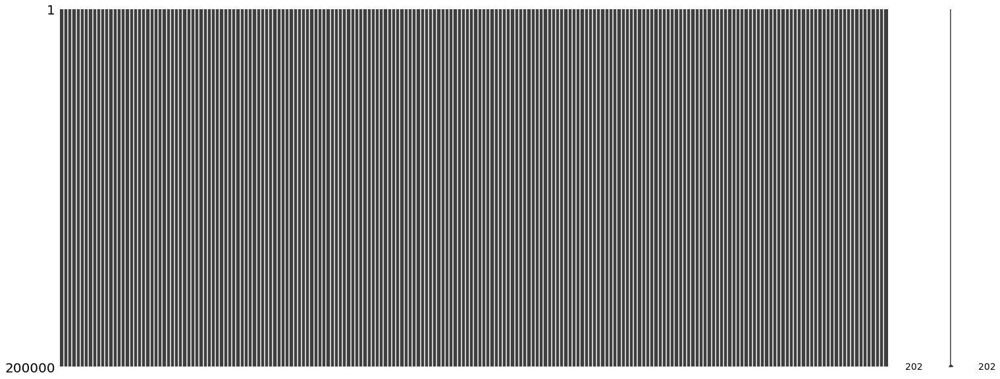

In [103]:
msno.matrix(train)

In [35]:
missing_values

{'target': 0,
 'var_0': 0,
 'var_1': 0,
 'var_2': 0,
 'var_3': 0,
 'var_4': 0,
 'var_5': 0,
 'var_6': 0,
 'var_7': 0,
 'var_8': 0,
 'var_9': 0,
 'var_10': 0,
 'var_11': 0,
 'var_12': 0,
 'var_13': 0,
 'var_14': 0,
 'var_15': 0,
 'var_16': 0,
 'var_17': 0,
 'var_18': 0,
 'var_19': 0,
 'var_20': 0,
 'var_21': 0,
 'var_22': 0,
 'var_23': 0,
 'var_24': 0,
 'var_25': 0,
 'var_26': 0,
 'var_27': 0,
 'var_28': 0,
 'var_29': 0,
 'var_30': 0,
 'var_31': 0,
 'var_32': 0,
 'var_33': 0,
 'var_34': 0,
 'var_35': 0,
 'var_36': 0,
 'var_37': 0,
 'var_38': 0,
 'var_39': 0,
 'var_40': 0,
 'var_41': 0,
 'var_42': 0,
 'var_43': 0,
 'var_44': 0,
 'var_45': 0,
 'var_46': 0,
 'var_47': 0,
 'var_48': 0,
 'var_49': 0,
 'var_50': 0,
 'var_51': 0,
 'var_52': 0,
 'var_53': 0,
 'var_54': 0,
 'var_55': 0,
 'var_56': 0,
 'var_57': 0,
 'var_58': 0,
 'var_59': 0,
 'var_60': 0,
 'var_61': 0,
 'var_62': 0,
 'var_63': 0,
 'var_64': 0,
 'var_65': 0,
 'var_66': 0,
 'var_67': 0,
 'var_68': 0,
 'var_69': 0,
 'var_70': 0,
 '

(0.0, 202.0)

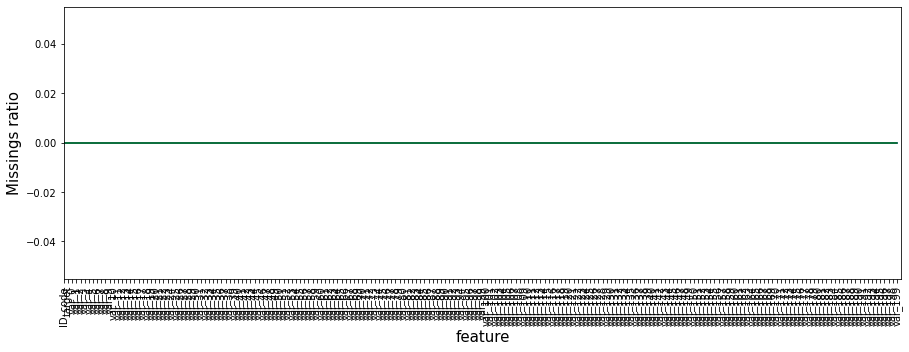

In [100]:
fig = plt.figure(figsize=(15, 5))
plt.plot(train.isnull().mean(), label="train", color="blue")
plt.plot(test.isnull().mean(), label="test", color="green")
plt.xticks(range(train.shape[1]), train.columns, rotation=90)
plt.ylabel("Missings ratio", size=15)
plt.xlabel("feature", size=15)
plt.xlim(0, train.shape[1])

Как видно, пропусков нет вообще

Посмотрим как распаределены признаки

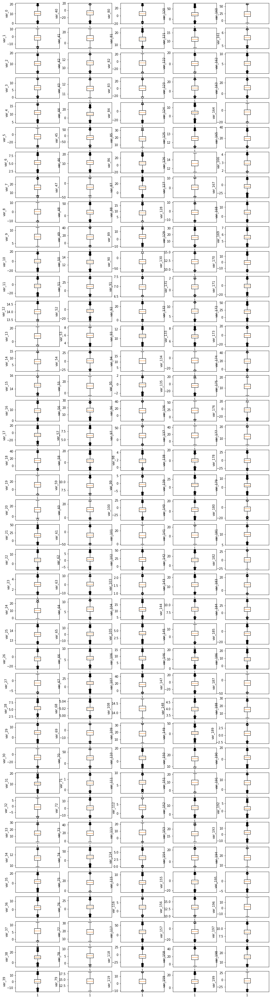

In [94]:
fig, axes = plt.subplots(nrows=40, ncols=5, figsize=(15, 60))
for num, i in enumerate(train.columns.to_list()[2:]):
    axes[num%40, num//40].boxplot(train[i])
    axes[num%40, num//40].set_ylabel(i)


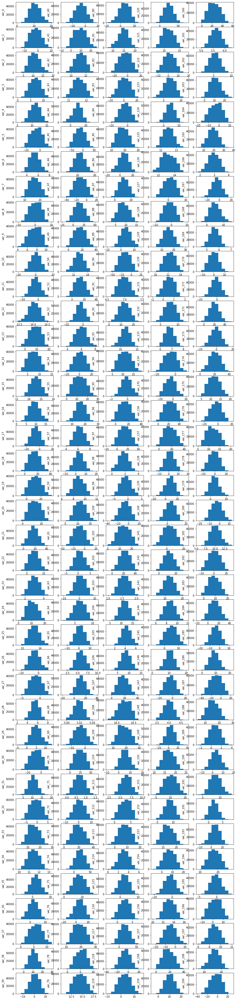

In [60]:
fig, axes = plt.subplots(nrows=40, ncols=5, figsize=(15, 70))
for num, i in enumerate(train.columns.to_list()[2:]):
    axes[num%40, num//40].hist(train[i])
    axes[num%40, num//40].set_ylabel(i)


Сравним с тестом

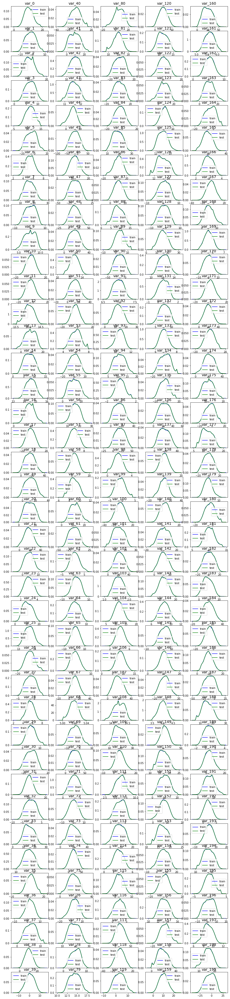

In [95]:
fig, axes = plt.subplots(40, 5, figsize=(15, 70))

for num, feature in enumerate(train.columns.to_list()[2:]):
    try:
        train_data, test_data = train[feature].copy(), test[feature].copy()
        sns.kdeplot(train_data, ax=axes[num%40, num//40 ], color="blue", label="train")
        sns.kdeplot(test_data, ax=axes[num%40, num//40 ], color="green", label="test")
    except RuntimeError:
        pass
    except KeyError:
        train_data = train[feature].copy()
        sns.kdeplot(train_data, ax=axes[num%40, num//40], color="blue", label="train")
    axes[num%40, num//40].set_title(feature, fontsize=14)

На первый взгляд с признакми все прекрасно!

Задание 2: Сделать базовый анализ целевой переменной, сделать выводы;

In [97]:
tr['target']

count    200000.000000
mean          0.100490
std           0.300653
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: target, dtype: float64

In [98]:
train['target'].value_counts()

0    179902
1     20098
Name: target, dtype: int64

Таргет бинарный и на 90 % состоит из 0

(array([179902.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,  20098.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

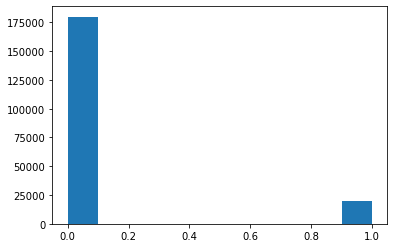

In [99]:
plt.hist(train['target'])

Если в качестве ответов проствить везде единицу, то 90% ответов будут правильные :). Похоже на скоринг очень строгого банка :)

Задание 3: Построить распределение признаков в зависимости от значения целевой переменной и распределение признаков для обучающей и тестовой выборки (если машина не позволяет построить распределение для всех признаков, то выполнить задание для признаков var_0, var_1, var_2, var_5, var_9, var_10, var_13, var_20, var_26, var_40, var_55, var_80, var_106, var_109, var_139, var_175, var_184, var_196), сделать выводы;

распределение признаков в зависимости от значения целевой 

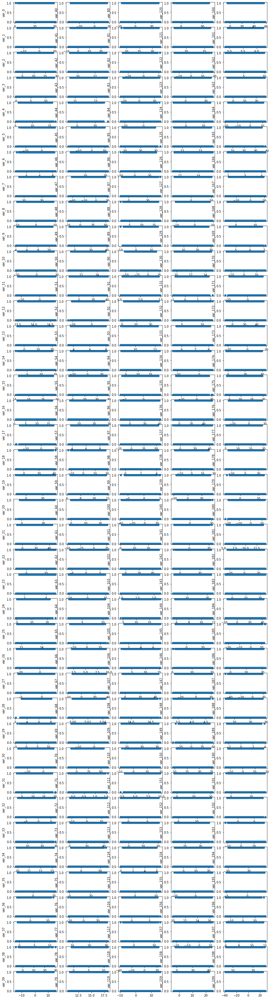

In [145]:
# scqtter признаков по таргету
fig, axes = plt.subplots(nrows=40, ncols=5, figsize=(15, 60))

for num, i in enumerate(train.columns.to_list()[2:]):
    axes[num%40, num//40].scatter(train[i],train['target'])
    axes[num%40, num//40].set_ylabel(i)

Распределение признаков в зависмости от значения таргета

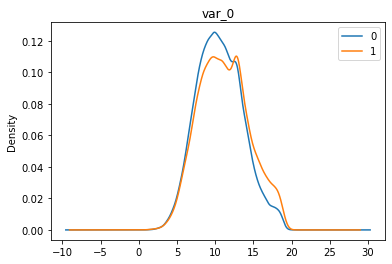

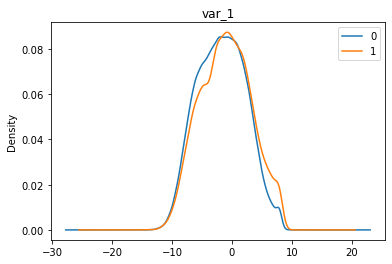

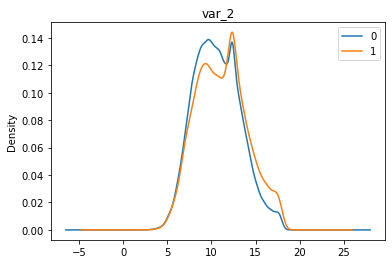

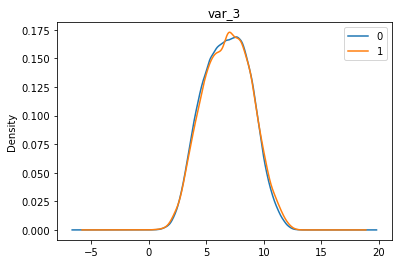

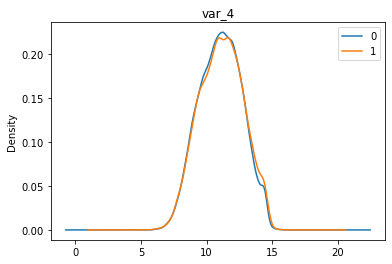

...

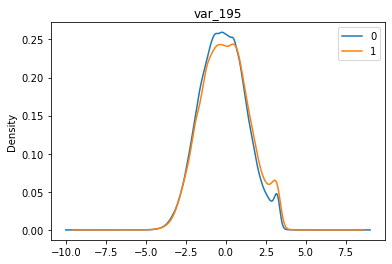

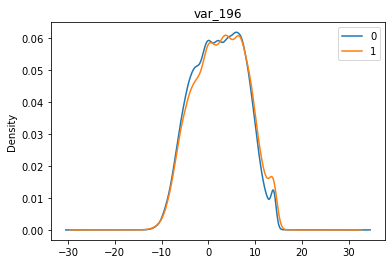

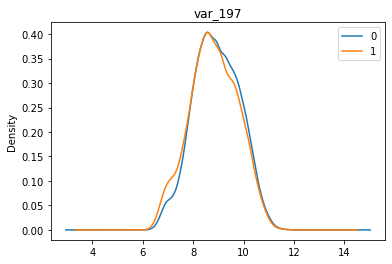

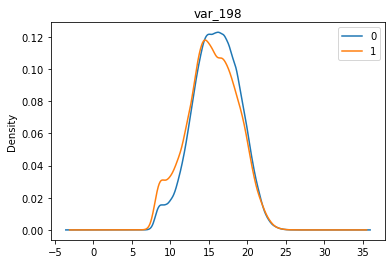

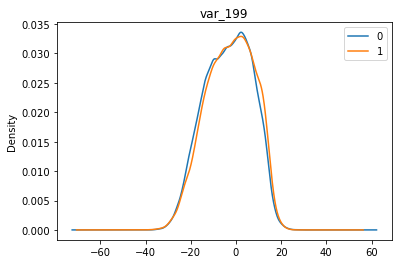

In [144]:
# распределение признаков в зависимости от  таргета
for  i in train.columns.to_list()[2:]:
    plt.axis =train[train['target']==0][i].plot.kde(label = '0',title=i,legend = True)
    plt.axis =train[train['target']==1][i].plot.kde(label = '1',legend = True)
    plt.show()

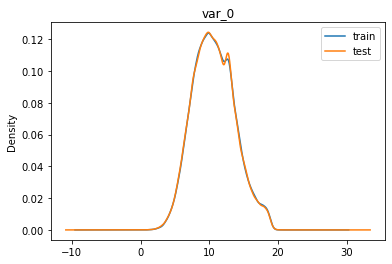

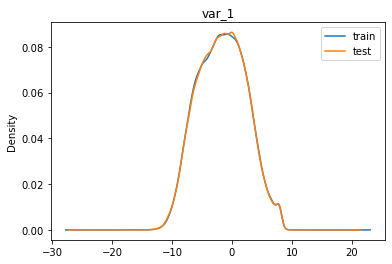

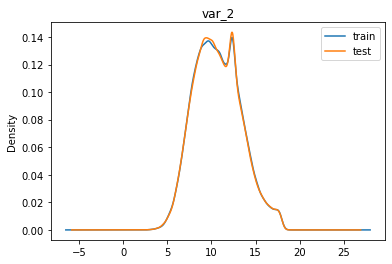

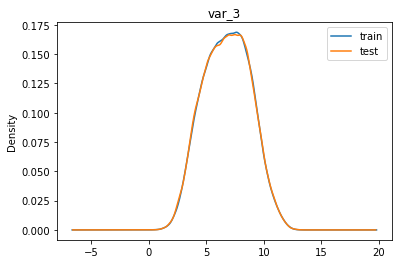

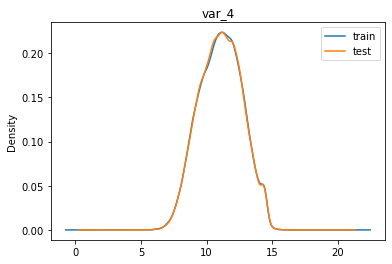

...

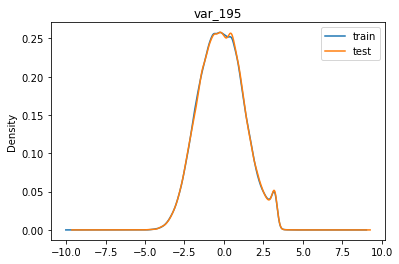

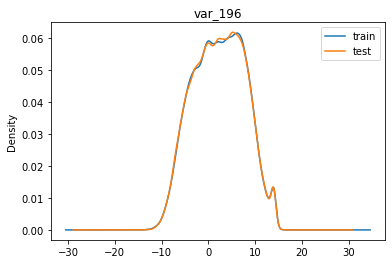

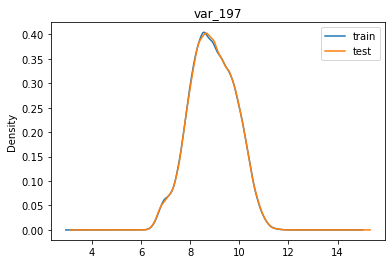

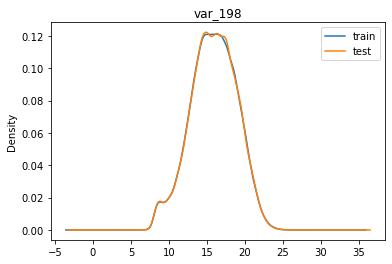

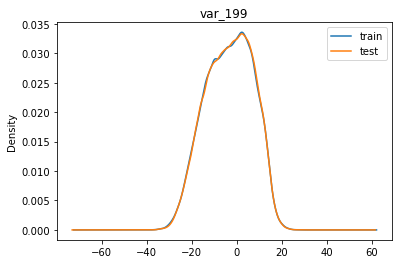

In [146]:
# kde train/test крупным планом
for  i in train.columns.to_list()[2:]:
    plt.axis =train[i].plot.kde(label = 'train',title=i,legend = True)
    plt.axis =test[i].plot.kde(label = 'test',legend = True)
    plt.show()

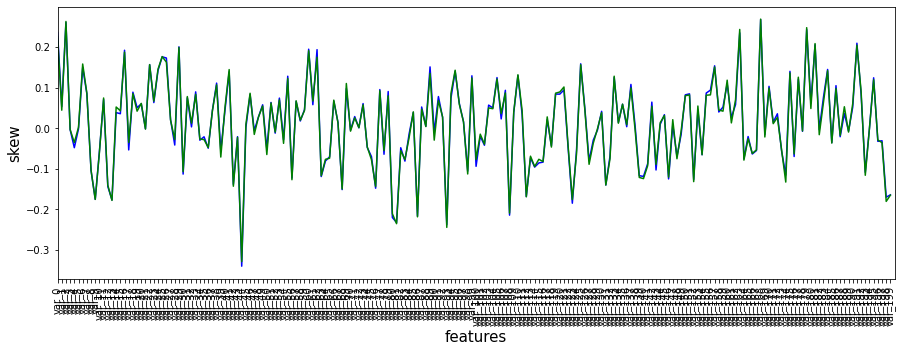

In [141]:
# skew для Train и test
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = train.drop(['target'],axis=1).skew(), test.skew()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.xlim(0, len(train_stats))
plt.ylabel("skew", size=15)
plt.show()

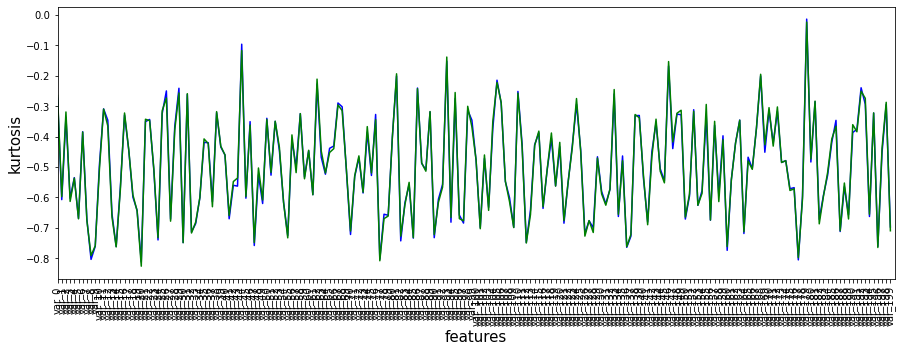

In [143]:
# kurtosis для Train и test
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = train.drop(['target'],axis=1).kurtosis(), test.kurtosis()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.ylabel("kurtosis", size=15)
plt.xlim(0, len(train_stats))
plt.show()

На тесте и на трейне признаки очень похожи. Распределение признаков в зависимости от целевой переменной очень слабо различимо. На большенстве признаков практически не заметно, на некоторых можно найти не большие различи.

Проведем анализ с какой долей точности каждый признак может идентифицировать таргет. Особенно на инстересует таргет равныйй единице, посольку его всего 10%

На тесте и на трейне признаки очень похожи. Распределение признаков в зависимости от целевой переменной 
очень слабо различимо. На большенстве признаков практически не заметно, на некоторых можно найти не большие различи\.

In [184]:
# Уникальное число значений в каждом признаке
a = set(train['var_0'])
# Уникальное число значение признака для таргета равного 0 и 1
a_1=set(train[train['target']==1]['var_0'].to_list())
a_0 = set(train[train['target']==0]['var_0'].to_list())
# Их пересечение, то есть тезначения по которым таргет может принять и 0 и 1 (смешивание)
a_i = a_1.intersection(a_0)
# Доля пересекающихся в a_1 во всех a_1
a_1_d = len(a_i) /len(a_1)      
# Доля пересекающихся в a_1 во всех a_1
a_0_d = len(a_i) /len(a_0)   
          
print(f'уникальность значений для а_1  {(1-a_1_d):.2f},уникальность для а_0 {1-a_0_d:.2f}')

уникальность значений для а_1  0.26,уникальность для а_0 0.85


In [193]:
analis_uniq_features = pd.DataFrame(columns=['a','a_0','a_1','a_i','a_0_d','a_1_d'])
for  i in train.columns.to_list()[2:]:
    a = set(train[i])
    a_1=set(train[train['target']==1][i].to_list())
    a_0 = set(train[train['target']==0][i].to_list())
    a_i = a_1.intersection(a_0)
    a_1_d = round(1-len(a_i) /len(a_1),2)
    a_0_d = round(1-len(a_i) /len(a_0),2)
    analis_uniq_features.loc[i]=[len(a),len(a_0),len(a_1),len(a_i),a_0_d,a_1_d]

In [218]:
analis_uniq_features.sort_values('a_1_d',ascending=False).head(50)

,a,a_0,a_1,a_i,a_0_d,a_1_d
var_45,169968.0,155292.0,19755.0,5079.0,0.97,0.74
var_117,164469.0,150646.0,19669.0,5846.0,0.96,0.70
var_74,161058.0,147776.0,19640.0,6358.0,0.96,0.68
var_97,158739.0,145882.0,19628.0,6771.0,0.95,0.66
var_61,159369.0,146441.0,19628.0,6700.0,0.95,0.66
var_187,157031.0,144594.0,19574.0,7137.0,0.95,0.64
var_136,156615.0,144128.0,19599.0,7112.0,0.95,0.64
var_120,158269.0,145664.0,19600.0,6995.0,0.95,0.64
var_90,157210.0,144642.0,19605.0,7037.0,0.95,0.64
var_160,156274.0,144001.0,19503.0,7230.0,0.95,0.63


Первые 50 признаков, которые лучше всего разделяют целевую переменную

Воспользуемся случайным лесом, для выявления наииболее важных признаков

In [213]:
%%time
parameters = {"max_depth": 8, 'min_samples_leaf' :5, "n_estimators": 100, "random_state": 27, "n_jobs": -1}

forest = RandomForestRegressor(**parameters)
forest.fit(train.drop(["target",'ID_code'], axis=1), target)

Wall time: 3min 3s


RandomForestRegressor(max_depth=8, min_samples_leaf=5, n_jobs=-1,
                      random_state=27)

Text(0.5, 1.0, 'What are the top important features to start with?')

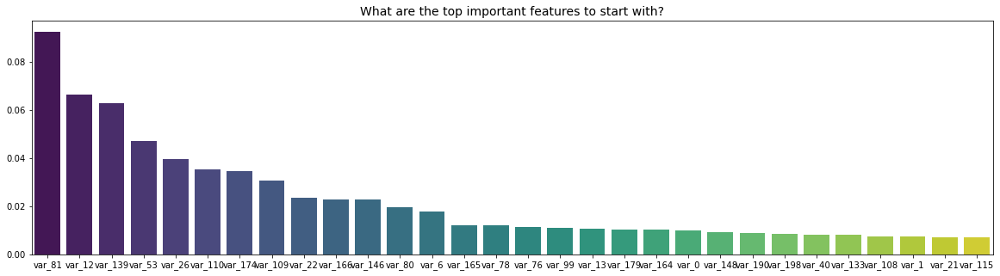

In [216]:
n_top = 30
importances = forest.feature_importances_
idx = np.argsort(importances)[-1:-n_top-1:-1]
feature_names = train.drop(["target",'ID_code'], axis=1).columns

plt.figure(figsize=(20, 5))
sns.barplot(x=feature_names[idx], y=importances[idx], palette="viridis")
plt.title("What are the top important features to start with?", size=14)

Мои ожиджани не оправдались :)

In [229]:
%%time
model = xgb.XGBClassifier()
model.fit(train.drop(["target",'ID_code'], axis=1), target)

Wall time: 40.4 s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

Text(0.5, 1.0, 'What are the top important features to start with?')

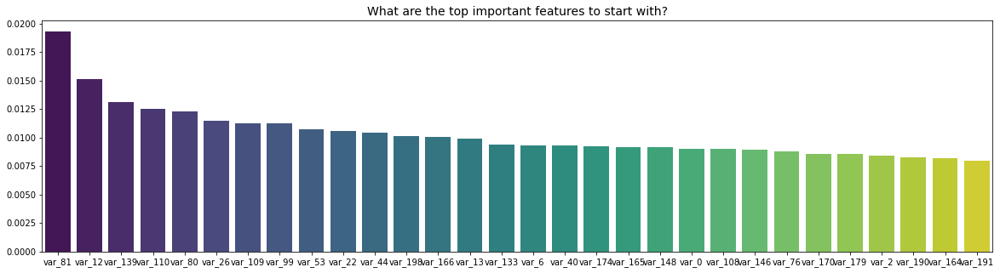

In [230]:
n_top = 30
importances = model.feature_importances_
idx = np.argsort(importances)[-1:-n_top-1:-1]
feature_names = train.drop(["target",'ID_code'], axis=1).columns

plt.figure(figsize=(20, 5))
sns.barplot(x=feature_names[idx], y=importances[idx], palette="viridis")
plt.title("What are the top important features to start with?", size=14)

Задание 4: Построить распределение основных статистик признаков (среднее, стандартное отклонение) в разрезе целевой переменной и распределение основных статистик обучающей и тестовой выборки, сделать выводы;

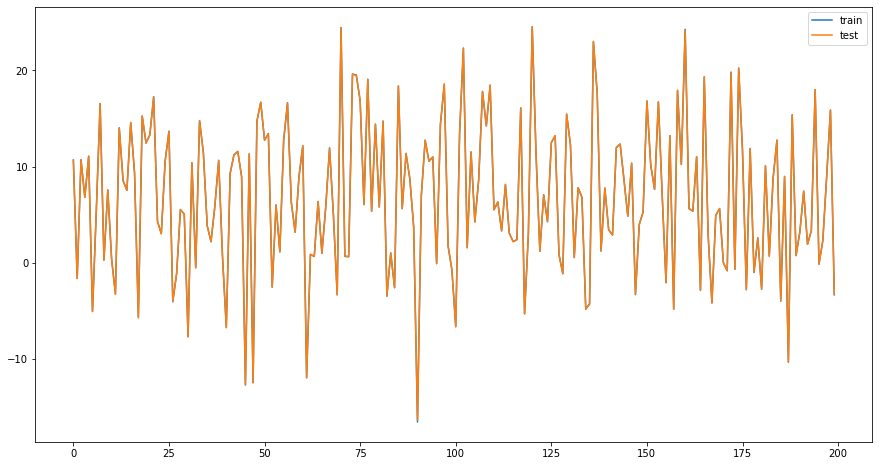

In [268]:
# Средняя по признакам на тесте и на трйне
plt.figure(figsize=(15,8))
plt.plot(list(range(len(tr.columns)-1)),tr.loc['mean'].to_list()[1:],label = 'train')
plt.plot(list(range(len(t.columns))),t.loc['mean'].to_list(), label = 'test')
plt.legend()

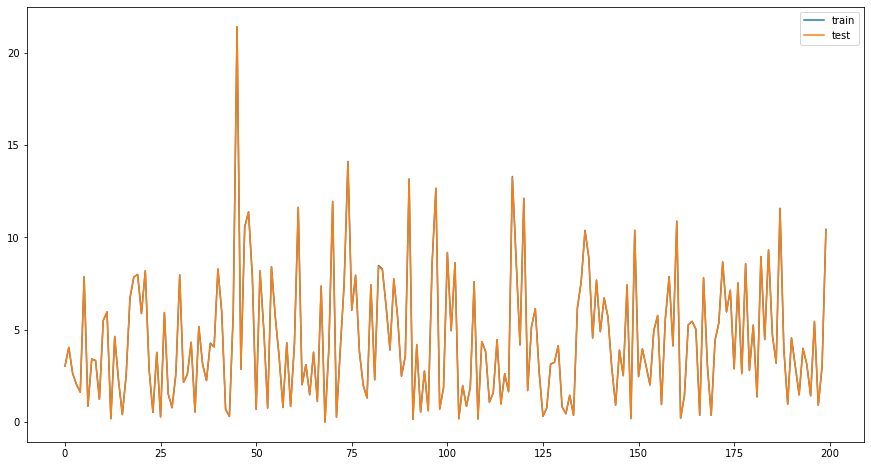

In [269]:
# std по признакам на тесте и на трйне
plt.figure(figsize=(15,8))
plt.plot(list(range(len(tr.columns)-1)),tr.loc['std'].to_list()[1:],label = 'train')
plt.plot(list(range(len(t.columns))),t.loc['std'].to_list(), label = 'test')
plt.legend()

Как видно train и test в точнгсти совпадают по mean и std

In [289]:
a=train.loc[:10000,'var_0'].to_numpy()

In [290]:
b = test.loc[:10000,'var_0'].to_numpy()

In [291]:
(a-b).mean()

-0.0060096290370963016

In [292]:
tr_1 = train[train['target']==1].describe()

In [294]:
tr_0 = train[train['target']==0].describe()

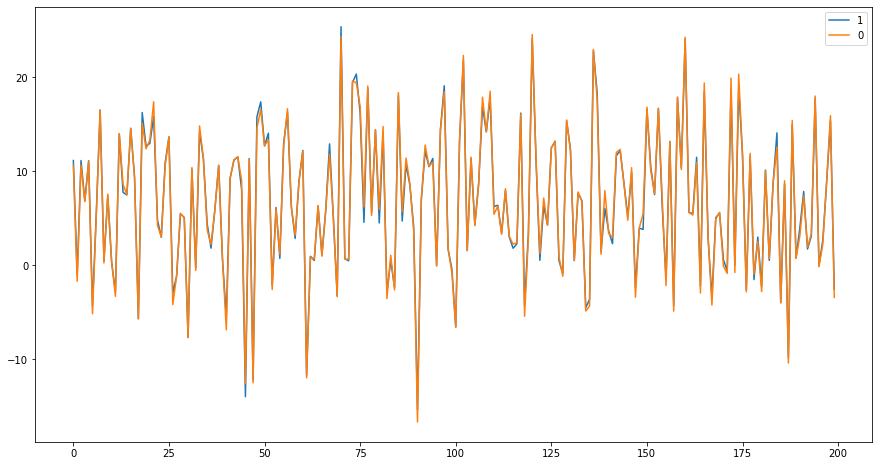

In [295]:
# Средняя по признакам на целевой переменной
plt.figure(figsize=(15,8))
plt.plot(list(range(len(tr_1.columns)-1)),tr_1.loc['mean'].to_list()[1:],label = '1')
plt.plot(list(range(len(tr_0.columns)-1)),tr_0.loc['mean'].to_list()[1:], label = '0')
plt.legend()

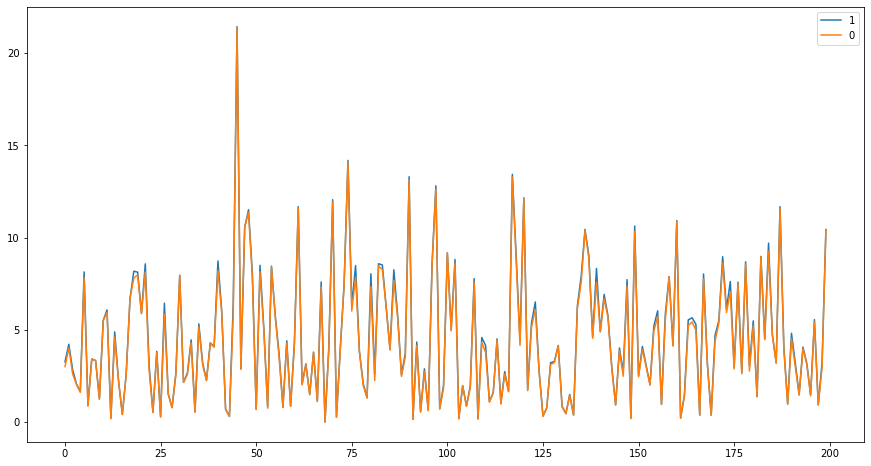

In [296]:
# std по признакам на целевой переменной
plt.figure(figsize=(15,8))
plt.plot(list(range(len(tr_1.columns)-1)),tr_1.loc['std'].to_list()[1:],label = '1')
plt.plot(list(range(len(tr_0.columns)-1)),tr_0.loc['std'].to_list()[1:], label = '0')
plt.legend()

Заметно что при таргете =1, амплитуда средних значений немного выше, соответсвенно и выше std

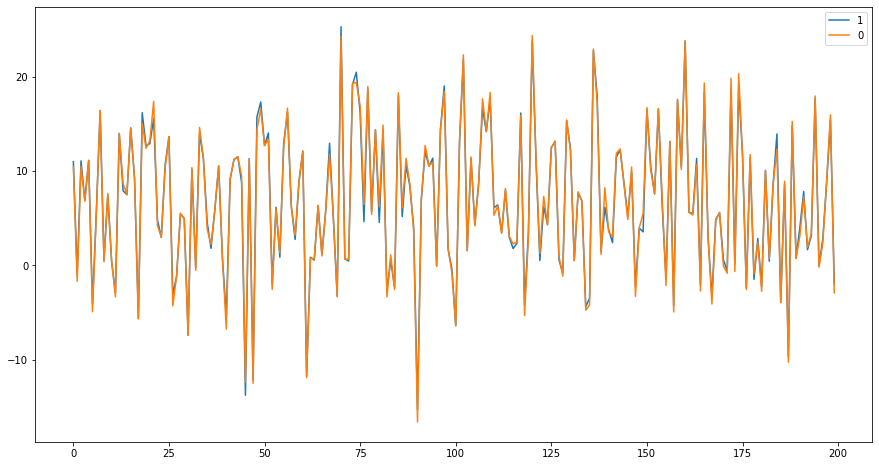

In [298]:
# медиана по признакам на целевой переменной
plt.figure(figsize=(15,8))
plt.plot(list(range(len(tr_1.columns)-1)),tr_1.loc['50%'].to_list()[1:],label = '1')
plt.plot(list(range(len(tr_0.columns)-1)),tr_0.loc['50%'].to_list()[1:], label = '0')
plt.legend()

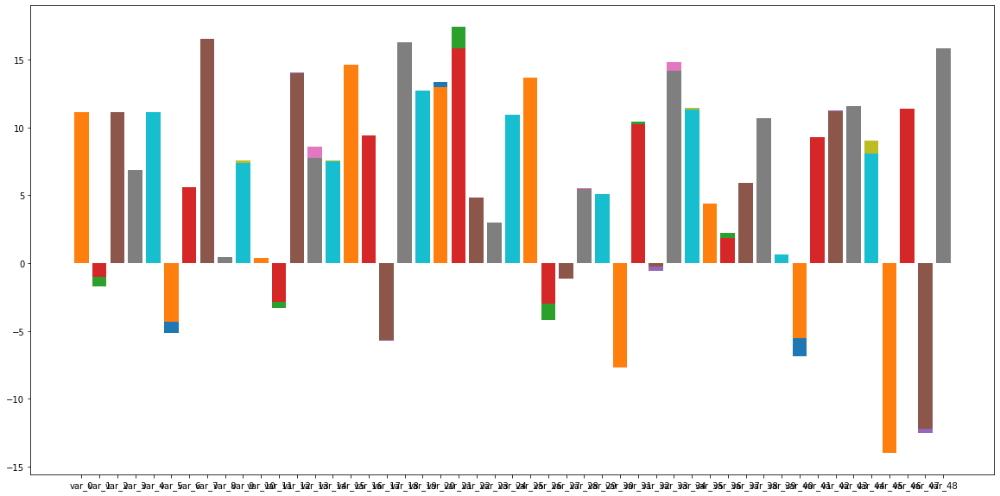

In [322]:
# Первые 50 средних по таргету
plt.figure(figsize=(20,10))
for i in tr_0.columns.to_list()[1:50]:
    plt.bar(i,tr_0.loc['mean',i])
    plt.bar(i,tr_1.loc['mean',i])

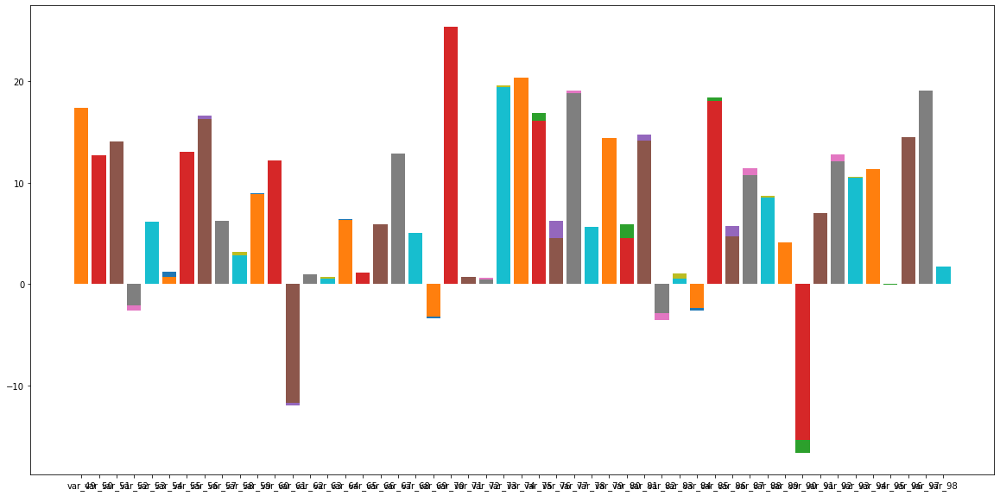

In [323]:
# Вторые 50 средних по таргету
plt.figure(figsize=(20,10))
for i in tr_0.columns.to_list()[50:100]:
    plt.bar(i,tr_0.loc['mean',i])
    plt.bar(i,tr_1.loc['mean',i])

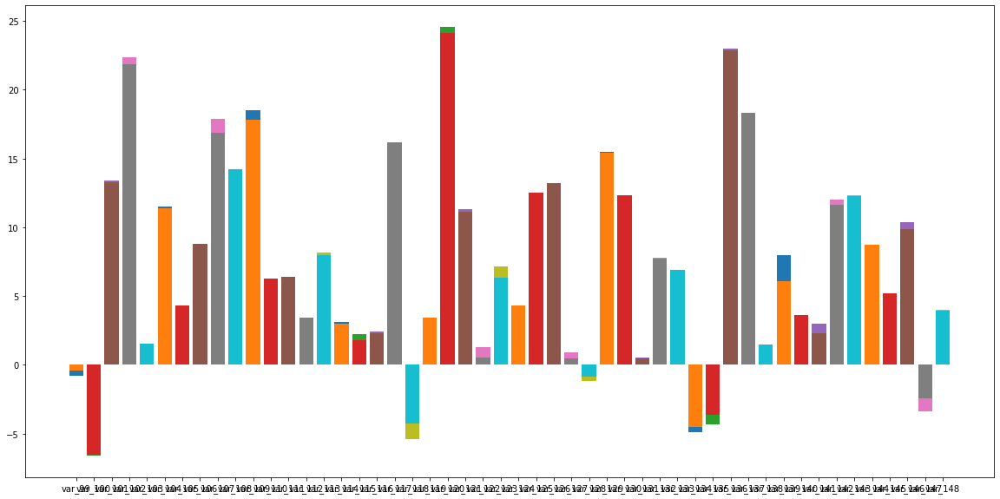

In [324]:
# Третьи 50 средних по таргету
plt.figure(figsize=(20,10))
for i in tr_0.columns.to_list()[100:150]:
    plt.bar(i,tr_0.loc['mean',i])
    plt.bar(i,tr_1.loc['mean',i])

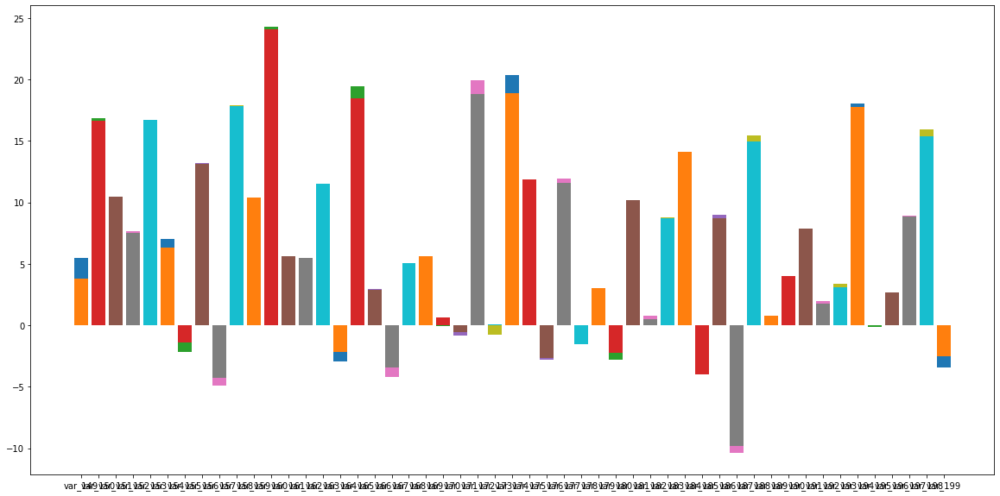

In [325]:
# последгие 50 средних по таргету
plt.figure(figsize=(20,10))
for i in tr_0.columns.to_list()[150:]:
    plt.bar(i,tr_0.loc['mean',i])
    plt.bar(i,tr_1.loc['mean',i])

Как видно средние значения по разным таргетам в большенстве примерно одинаковые, имеются некторые признаки где есть отличия до 25-*30%

Задание 5: Построить распределение коэффициентов корреляции между признаками. Есть ли зависимость между признаками (будем считать, что связь между признаками отсутствует, если коэффициент корреляции < 0.2)?

In [327]:
correlation = train.corr()

In [328]:
correlation

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
target,1.000000,0.052390,0.050343,0.055870,0.011055,0.010915,0.030979,0.066731,-0.003025,0.019584,...,0.055973,0.047114,-0.042858,-0.017709,-0.022838,0.028285,0.023608,-0.035303,-0.053000,0.025434
var_0,0.052390,1.000000,-0.000544,0.006573,0.003801,0.001326,0.003046,0.006983,0.002429,0.004962,...,0.002752,0.000206,-0.005373,0.001616,-0.001514,0.002073,0.004386,-0.000753,-0.005776,0.003850
var_1,0.050343,-0.000544,1.000000,0.003980,0.000010,0.000303,-0.000902,0.003258,0.001511,0.004098,...,0.006627,0.003621,-0.002604,0.001153,-0.002557,-0.000785,-0.000377,-0.004157,-0.004861,0.002287
var_2,0.055870,0.006573,0.003980,1.000000,0.001001,0.000723,0.001569,0.000883,-0.000991,0.002648,...,0.000197,0.001285,-0.003400,0.000549,0.002104,-0.001070,0.003952,0.001078,-0.000877,0.003855
var_3,0.011055,0.003801,0.000010,0.001001,1.000000,-0.000322,0.003253,-0.000774,0.002500,0.003553,...,0.000151,0.002445,-0.001530,-0.001699,-0.001054,0.001206,-0.002800,0.001164,-0.001651,0.000506
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
var_195,0.028285,0.002073,-0.000785,-0.001070,0.001206,0.003706,-0.001274,0.001244,0.001854,0.001396,...,0.004571,0.000870,-0.004745,-0.003143,-0.001201,1.000000,0.002517,-0.004170,-0.000536,0.002042
var_196,0.023608,0.004386,-0.000377,0.003952,-0.002800,0.000513,0.002880,0.005378,0.001045,-0.003242,...,-0.000847,0.002466,-0.001386,-0.005308,-0.005040,0.002517,1.000000,-0.000454,0.000253,0.000607
var_197,-0.035303,-0.000753,-0.004157,0.001078,0.001164,-0.000046,-0.000535,-0.003565,0.003466,-0.004583,...,-0.004974,0.000906,-0.000527,0.005068,0.000884,-0.004170,-0.000454,1.000000,0.001183,0.004991
var_198,-0.053000,-0.005776,-0.004861,-0.000877,-0.001651,-0.001821,-0.000953,-0.003025,0.000650,0.002950,...,-0.000153,-0.000067,0.003451,0.001646,0.003194,-0.000536,0.000253,0.001183,1.000000,-0.004731


In [337]:
flag = True
for i in correlation:
    d = correlation[(correlation[i]>0.2)&(correlation[i]<1)][i]
    if len(d)>0:
        print(d)
        flag=False
if flag:
    print('Нет признаков с корреляцией более 0,2')   

Нет признаков с корреляцией более 0,2


Text(0, 0.5, 'Density')

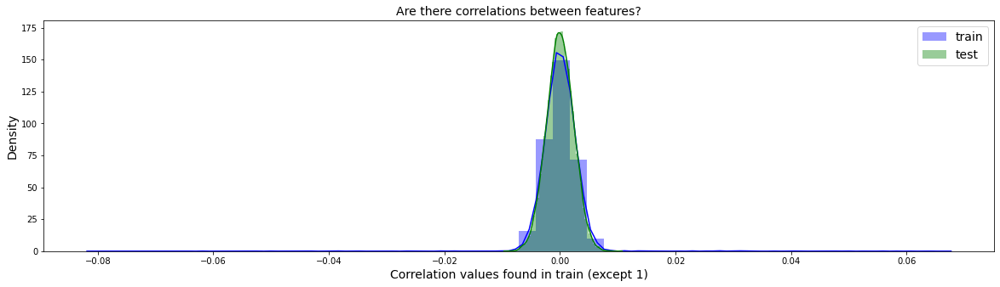

In [338]:
train_correlations = correlation
train_correlations = train_correlations.values.flatten()
train_correlations = train_correlations[train_correlations != 1]

columns = correlation.columns.tolist()
columns.remove("target")

test_correlations = test[columns].corr()
test_correlations = test_correlations.values.flatten()
test_correlations = test_correlations[test_correlations != 1]

plt.figure(figsize=(20,5))
sns.distplot(train_correlations, color="Blue", label="train")
sns.distplot(test_correlations, color="Green", label="test")

plt.xlabel("Correlation values found in train (except 1)", size=14)
plt.title("Are there correlations between features?", size=14)
plt.legend(loc="best", fontsize=14)
plt.ylabel("Density", size=14)

Корреляция признаков на train и на test почти совпадает

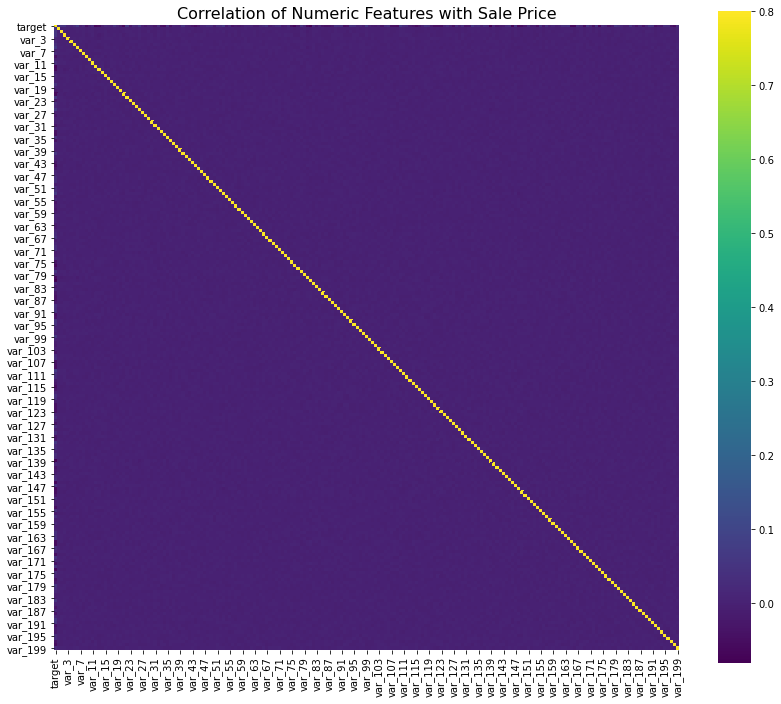

In [339]:
fig, axes = plt.subplots(figsize = (14,12))
plt.title("Correlation", y=1, size=16)
sns.heatmap(correlation, square=True, vmax=0.8, cmap="viridis")

Как видно полностью отсутвует

Задание 6: Выявить 10 признаков, которые обладают наибольшей нелинейной связью с целевой переменной.

Даные исследования были проделаны выше 

Исходя из рандомного леса, самые важные признаки

In [349]:
n_top = 10
importances = model.feature_importances_
idx = np.argsort(importances)[-1:-n_top-1:-1]
feature_names = train.drop(["target",'ID_code'], axis=1).columns
feature_names[idx].to_list()

['var_81',
 'var_12',
 'var_139',
 'var_110',
 'var_80',
 'var_26',
 'var_109',
 'var_99',
 'var_53',
 'var_22']

Исходя из уникальности значений по поддержке таргета

In [350]:
analis_uniq_features.sort_values('a_1_d',ascending=False).head(10)

,a,a_0,a_1,a_i,a_0_d,a_1_d
var_45,169968.0,155292.0,19755.0,5079.0,0.97,0.74
var_117,164469.0,150646.0,19669.0,5846.0,0.96,0.70
var_74,161058.0,147776.0,19640.0,6358.0,0.96,0.68
var_97,158739.0,145882.0,19628.0,6771.0,0.95,0.66
var_61,159369.0,146441.0,19628.0,6700.0,0.95,0.66
var_187,157031.0,144594.0,19574.0,7137.0,0.95,0.64
var_136,156615.0,144128.0,19599.0,7112.0,0.95,0.64
var_120,158269.0,145664.0,19600.0,6995.0,0.95,0.64
var_90,157210.0,144642.0,19605.0,7037.0,0.95,0.64
var_160,156274.0,144001.0,19503.0,7230.0,0.95,0.63


Задание 7: Провести анализ идентичности распределения признаков на обучающей и тестовой выборках, сделать выводы.

Kolmogorov-Smirnov Test

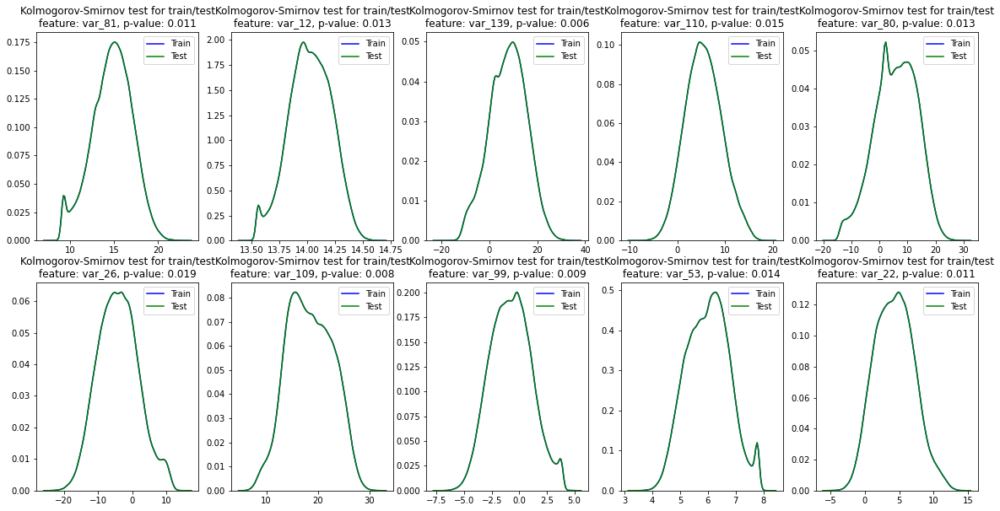

In [352]:
statistics_array = []
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

for num, feature in enumerate(feature_names[idx]):
    statistic, pvalue = ks_2samp(
        train[feature].sample(10000), test[feature].sample(10000)
    )
    statistics_array.append(statistic)

    sns.kdeplot(train[feature], ax=axes[num//5, num%5], color="Blue", label="Train")
    sns.kdeplot(train[feature], ax=axes[num//5, num%5], color="Green", label="Test")

    axes[num//5, num%5].set_title(
        (f"Kolmogorov-Smirnov test for train/test\n"
        f"feature: {feature}, p-value: {round(statistic, 3)}")
    )

Population Stability Index

In [355]:
features_to_score = train.drop(["ID_code", "target"], axis=1).columns.tolist()
psi = PSI(threshold=0.01)

In [356]:
psi.fit_transform(
    X=train[features_to_score],
    y=test[features_to_score]
)

  0%|                                                                                          | 0/200 [00:00<?, ?it/s]<ipython-input-353-b3cb30ead4e5>:141: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  psi_score = np.sum(
100%|████████████████████████████████████████████████████████████████████████████████| 200/200 [00:13<00:00, 15.18it/s]


,Variable,PSI,Selected
0,var_154,0.000085,1
1,var_156,0.000132,1
2,var_5,0.000138,1
3,var_148,0.000150,1
4,var_35,0.000151,1
...,...,...,...
195,var_124,0.000615,1
196,var_79,0.000628,1
197,var_162,0.000639,1
198,var_29,0.000667,1
